<a href="https://colab.research.google.com/github/emely3h/Geospatial_ML/blob/main/image_processing/color_spaces.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Color Spaces

### Prepare Colab, import dataset

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
#! ls
%cd drive/MyDrive/MachineLearning/
#! git clone https://github.com/emely3h/Geospatial_ML.git
%cd Geospatial_ML
! ls
#! git pull

/content/drive/.shortcut-targets-by-id/15HUD3sGdfvxy5Y_bjvuXgrzwxt7TzRfm/MachineLearning
/content/drive/.shortcut-targets-by-id/15HUD3sGdfvxy5Y_bjvuXgrzwxt7TzRfm/MachineLearning/Geospatial_ML
data_exploration  evaluation   models	    prepare_data    README.md
docs		  experiments  poetry.lock  pyproject.toml  requirements.txt


In [64]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
from data_exploration.display_images import display 
import cv2
import tensorflow as tf
from skimage import color

In [9]:
total_tiles = 11121
train_tiles = 6672
test_val_tiles = 2224
data_path = "../data_colab/256_256"

In [10]:
mask  = np.load(os.path.join(data_path,'2022_06_20.npz'))['y_mask']
input  = np.load(os.path.join(data_path,'2022_06_20.npz'))['x_input']

print(mask.shape)
print(input.shape)

(761, 256, 256)
(761, 256, 256, 5)


In [17]:
selected_input = [input[19], input[26], input[27], input[31], input[32], input[36], input[37]]
selected_mask = [mask[19], mask[26], mask[27], mask[31], mask[32], mask[36], mask[37]]

### RGB

- most widely used for screens
- one channel per color (red, green, blue)

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/c/c7/The_three_primary_colors_of_RGB_Color_Model_%28Red%2C_Green%2C_Blue%29.png" width="300"/>
</div>

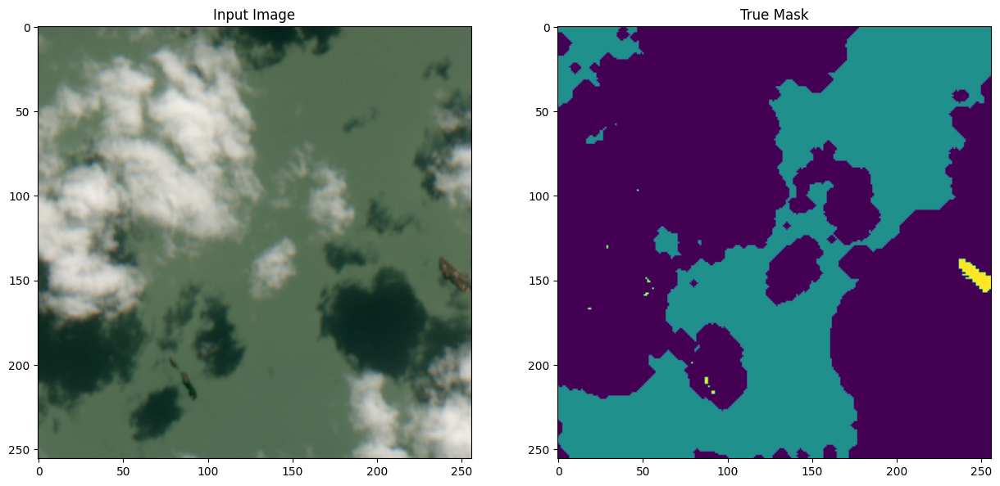

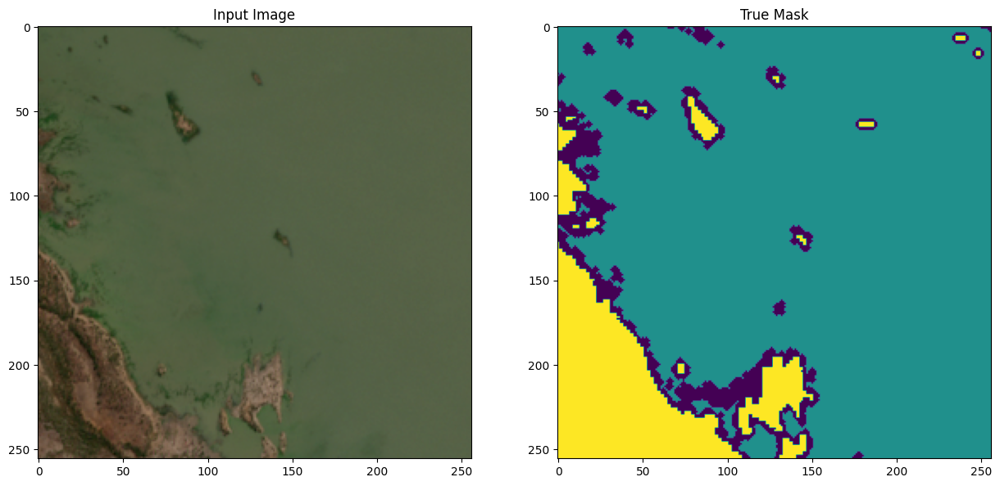

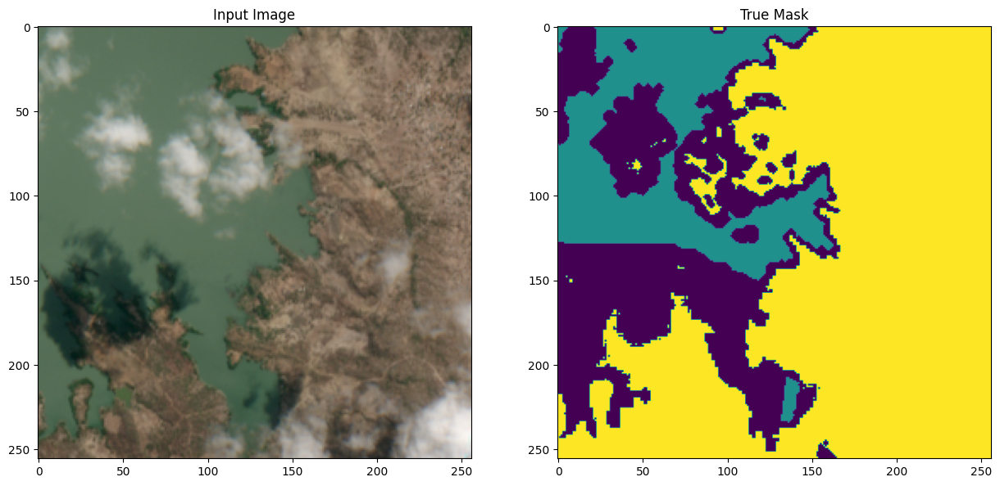

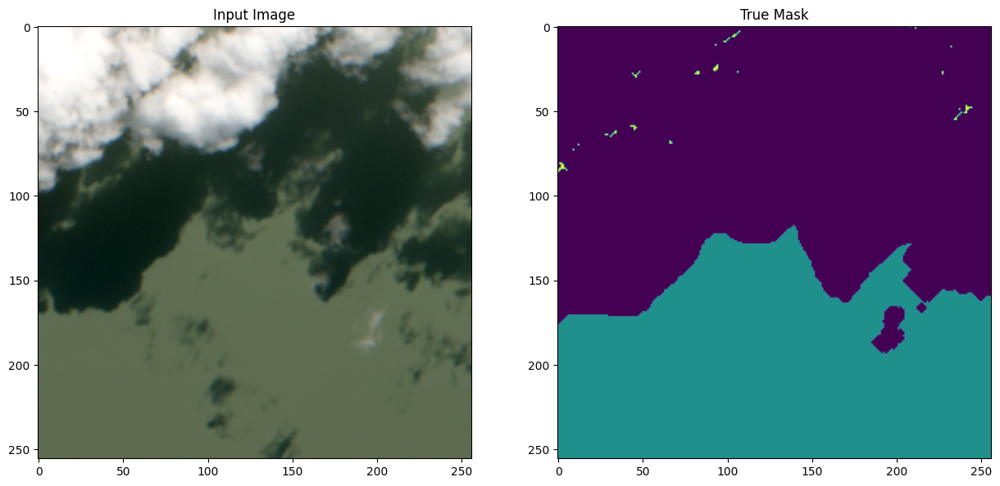

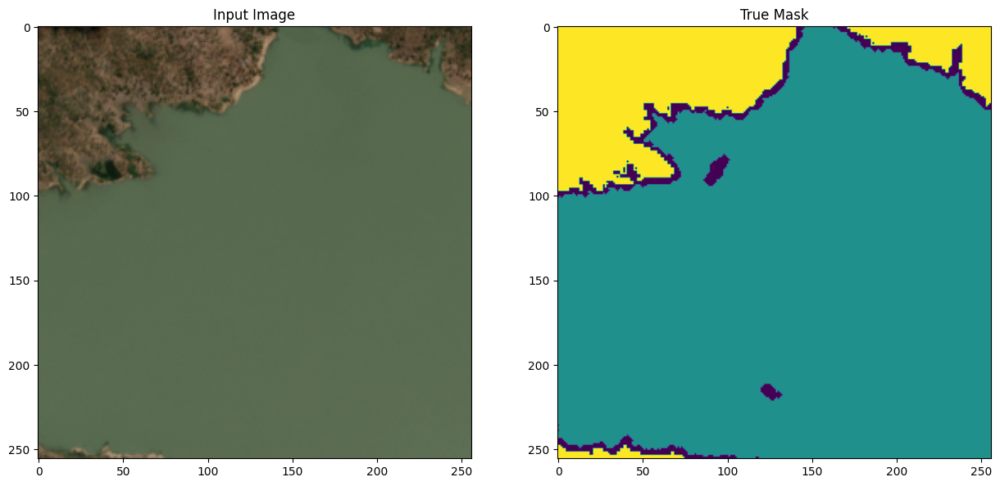

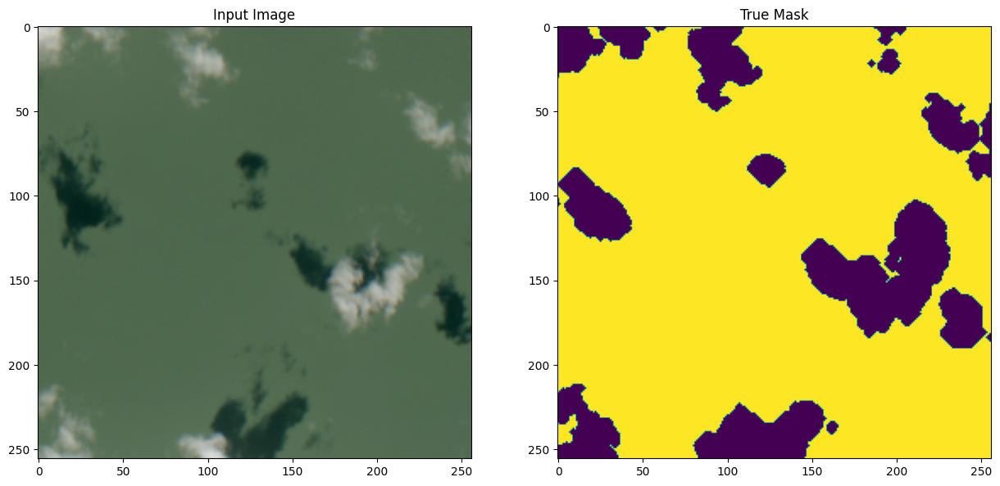

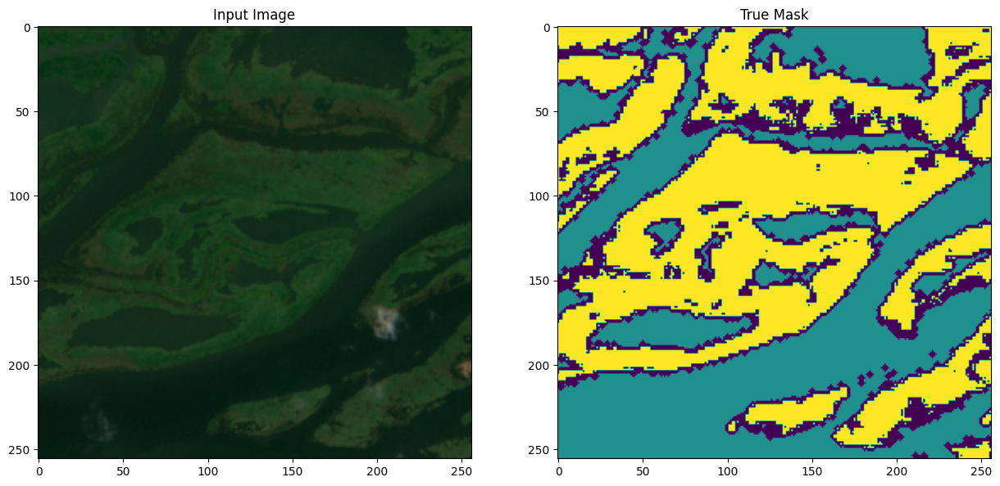

In [33]:
display(selected_input, selected_mask)

### CMYK
- used by printers
- additive (the more color we add the darker the resulting color)
- C: cyan
- M: magenta
- Y: Yellow
- K: Key (black) 

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/2/2e/CMYK_DIN_ISO_2846_1_LAB_to_RGB.svg/1280px-CMYK_DIN_ISO_2846_1_LAB_to_RGB.svg.png" width="300"/>
</div>

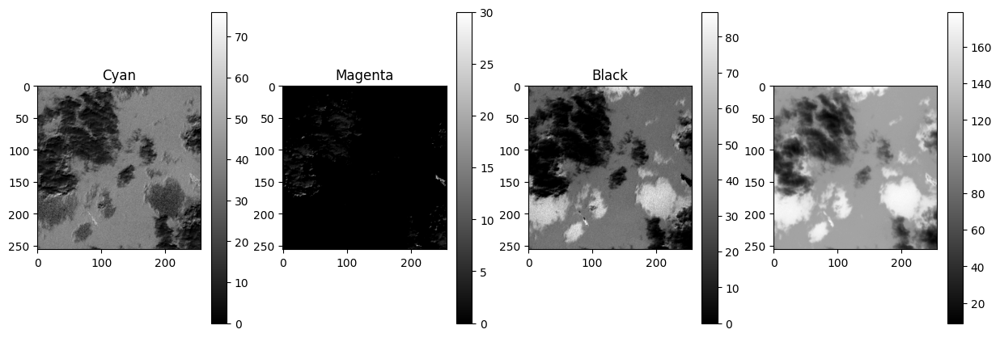

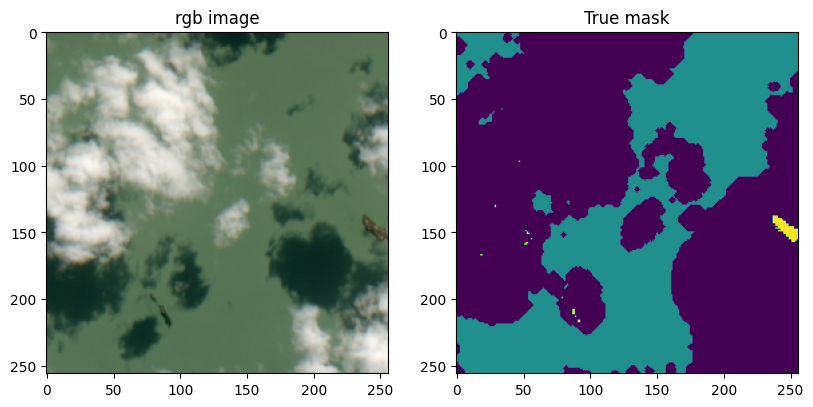

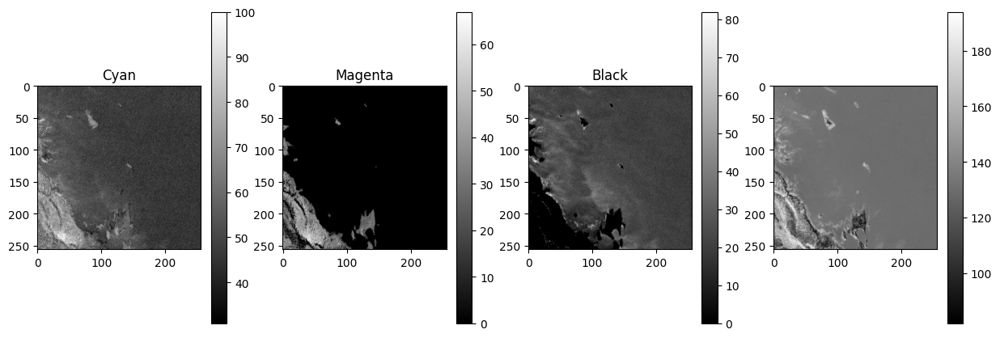

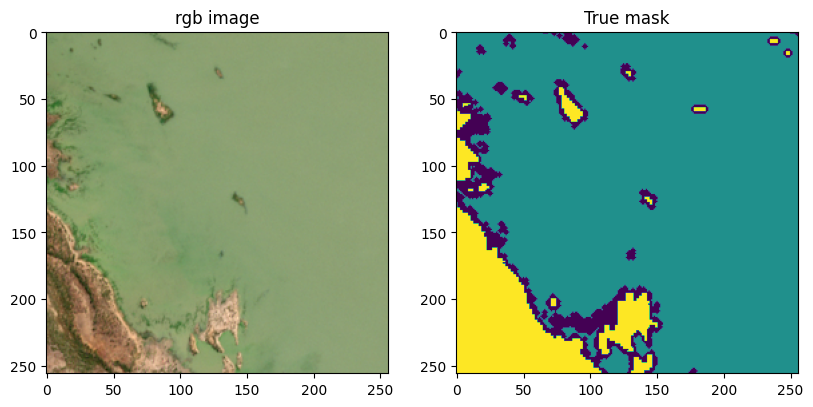

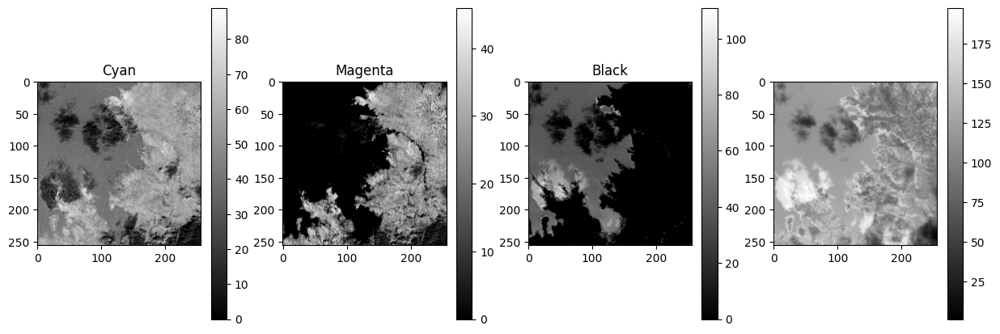

...

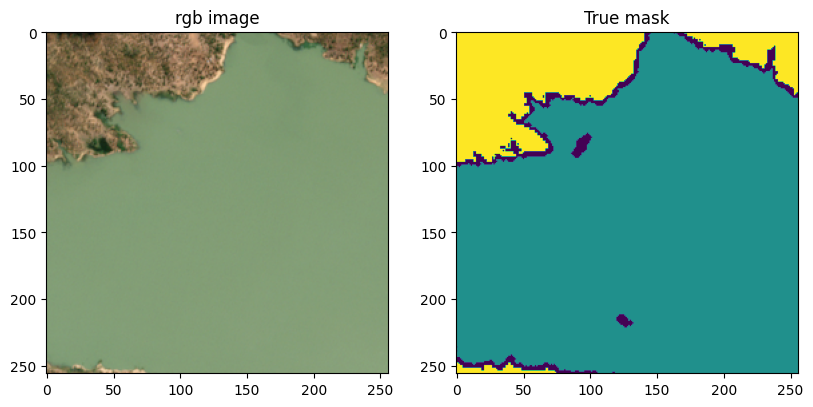

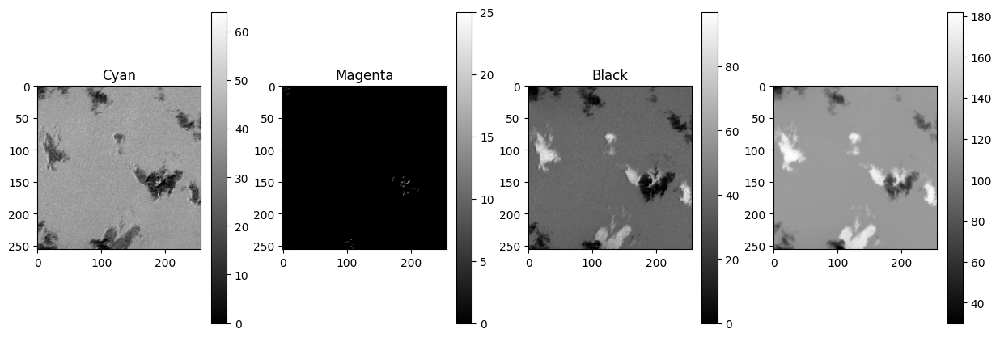

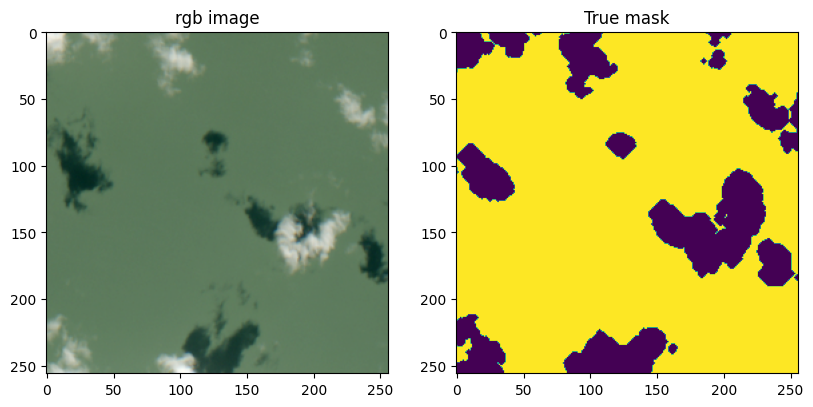

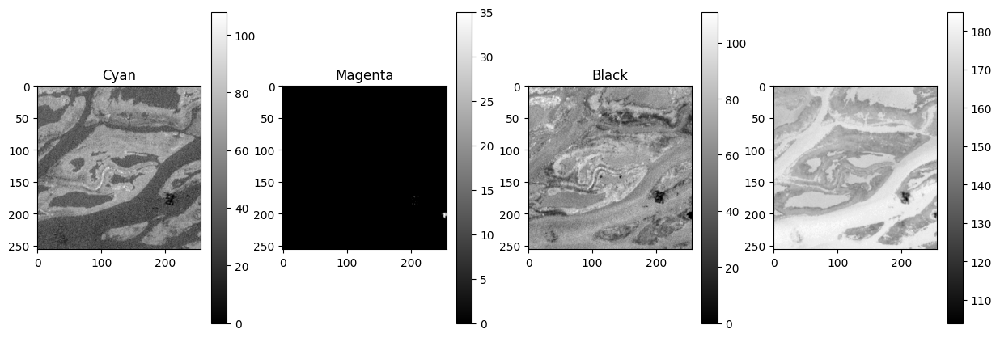

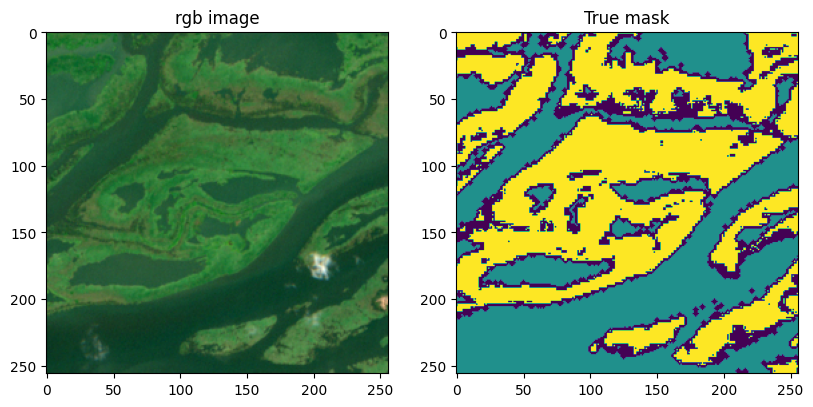

In [68]:
import colorsys

def display_cmyk_channels(input_img, mask_img):
  rgb_channels = input_img[:, :, :3]

  bgr = rgb_channels.astype(float)/255.

  # Extract channels
  with np.errstate(invalid='ignore', divide='ignore'):
    K = 1 - np.max(bgr, axis=2)
    C = (1-bgr[...,2] - K)/(1-K)
    M = (1-bgr[...,1] - K)/(1-K)
    Y = (1-bgr[...,0] - K)/(1-K)

  # Convert the input BGR image to CMYK colorspace
  cmyk = (np.dstack((C,M,Y,K)) * 255).astype(np.uint8)

  fig, axes = plt.subplots(1, 4, figsize=(15, 5))
  img_0 = axes[0].imshow(cmyk[:, :, 0], cmap='gray')
  axes[0].set_title('Cyan')
  cbar_0 = plt.colorbar(img_0, ax=axes[0])
  img_1 = axes[1].imshow(cmyk[:, :, 1], cmap='gray')
  axes[1].set_title('Magenta')
  cbar_1 = plt.colorbar(img_1, ax=axes[1])
  img_2 = axes[2].imshow(cmyk[:, :, 2], cmap='gray')
  axes[2].set_title('Yellow')
  cbar_2 = plt.colorbar(img_2, ax=axes[2])
  img_3 = axes[3].imshow(cmyk[:, :, 3], cmap='gray')
  axes[2].set_title('Black')
  cbar_3 = plt.colorbar(img_3, ax=axes[3])
  plt.show()


  fig, axes = plt.subplots(1, 2, figsize=(9.7, 5))
  axes[0].imshow(tf.keras.utils.array_to_img(input_img[:, :, :3]))
  axes[0].set_title('rgb image')
  axes[1].imshow(mask_img)
  axes[1].set_title('True mask')
  plt.show()

  
for idx, image in enumerate(selected_input):
  display_cmyk_channels(selected_input[idx], selected_mask[idx])
  print()
  print()

### YCbCr
- more close to how our eyes perceive color => human eye is more sensitive to brightness than to color
- distinguishes between color and luminance
- Y => luminance
- Cb => blue-yellow-chrominance
- Cr => red-green-chrominance
- widely used for compression (e.g. jpeg) as color information and brighness information cna be compressed independently from each other

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/3/34/YCbCr-CbCr_Scaled_Y50.png/1280px-YCbCr-CbCr_Scaled_Y50.png" width="300"/>
</div>

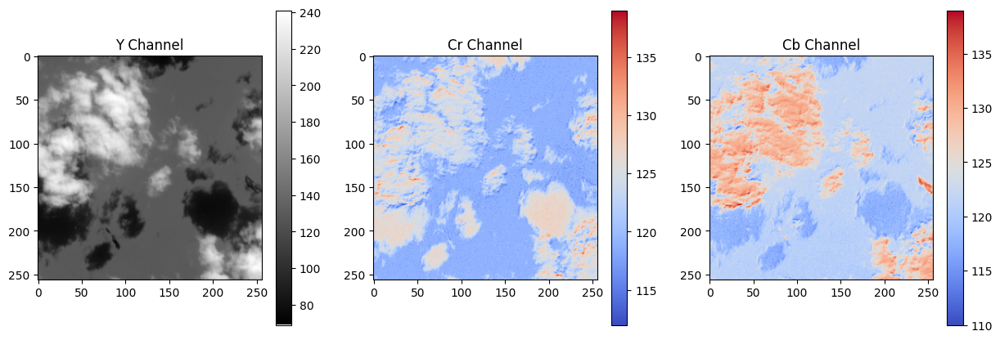

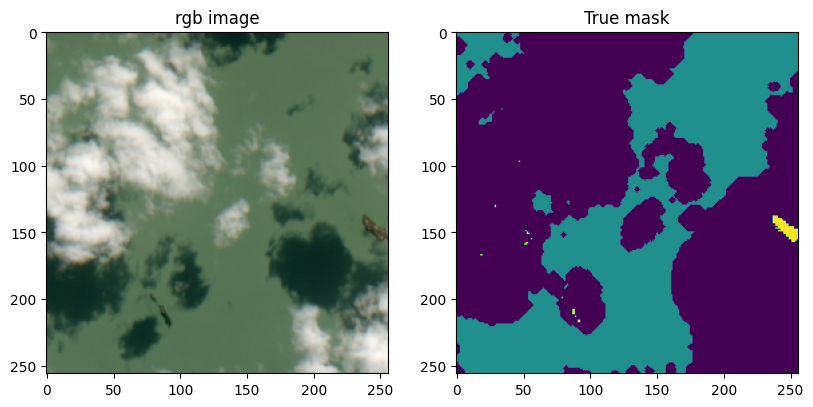

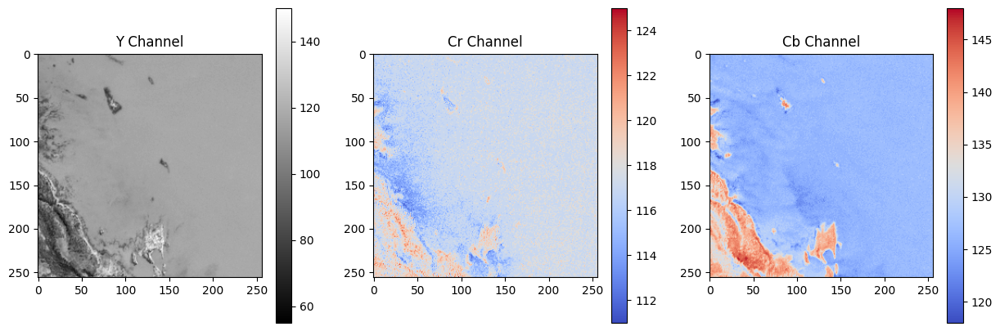

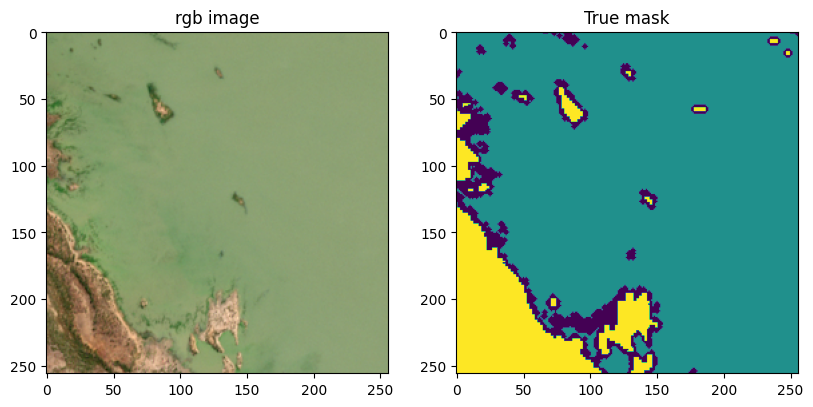

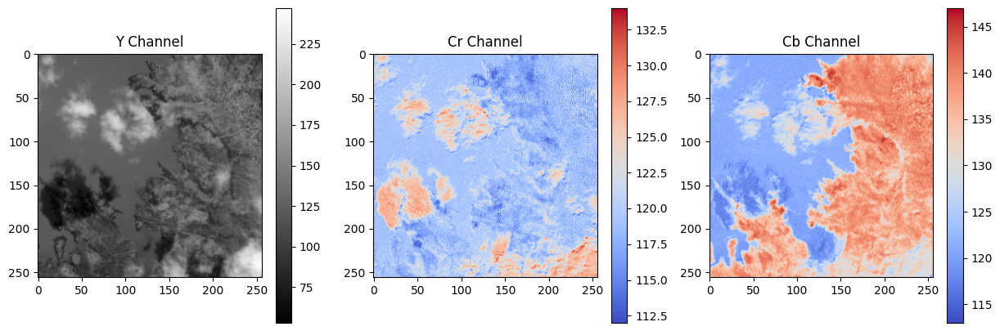

...

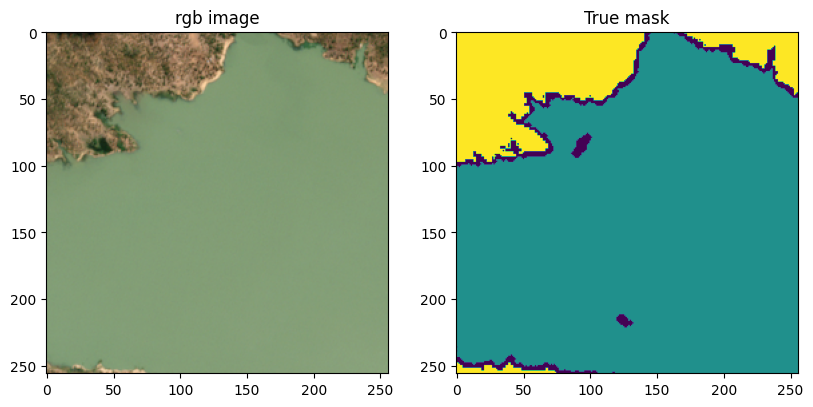

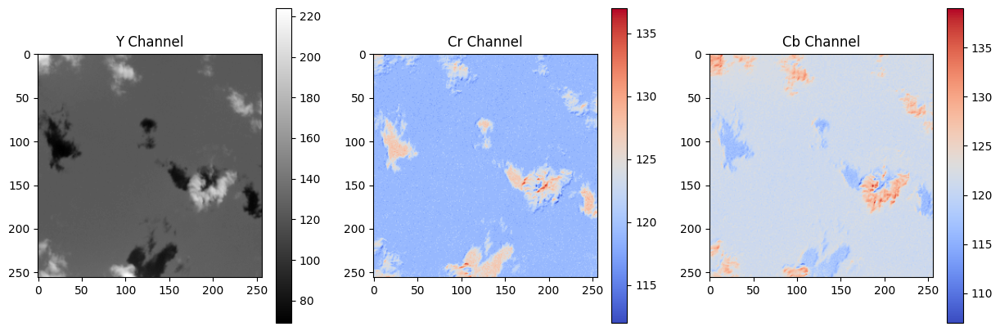

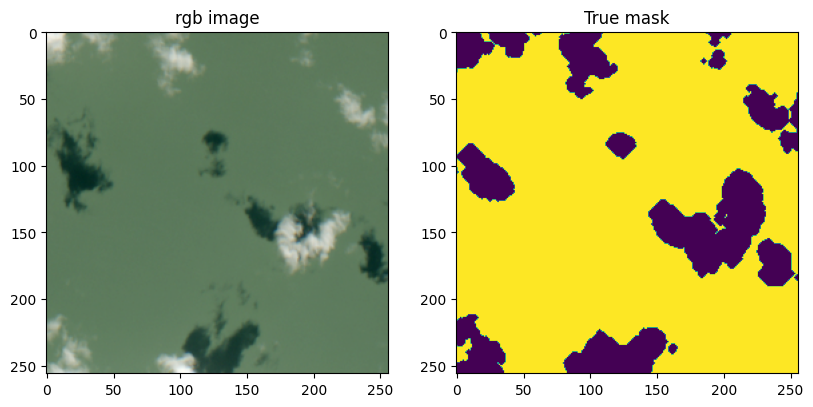

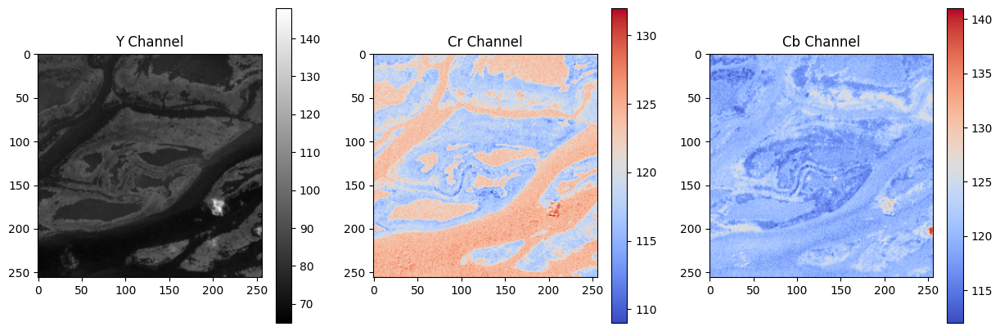

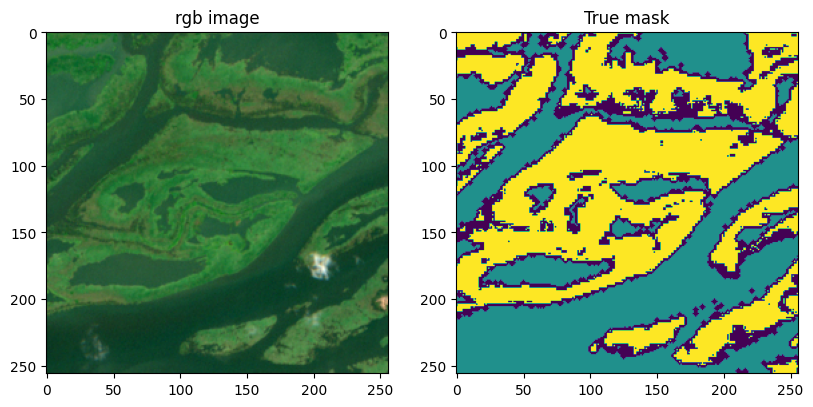

In [62]:
def display_ycbcr_channels(input_img, mask_img):
  rgb_channels = input_img[:, :, :3]
  rgb_channels = np.uint8(rgb_channels)
  ycbcr = cv2.cvtColor(rgb_channels, cv2.COLOR_BGR2YCrCb)

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))
  img_0 = axes[0].imshow(ycbcr[:, :, 0], cmap='gray')
  axes[0].set_title('Y Channel')
  cbar_0 = plt.colorbar(img_0, ax=axes[0])
  img_1 = axes[1].imshow(ycbcr[:, :, 1], cmap='coolwarm')
  axes[1].set_title('Cr Channel')
  cbar_1 = plt.colorbar(img_1, ax=axes[1])
  img_2 = axes[2].imshow(ycbcr[:, :, 2], cmap='coolwarm')
  axes[2].set_title('Cb Channel')
  cbar_2 = plt.colorbar(img_2, ax=axes[2])
  plt.show()


  fig, axes = plt.subplots(1, 2, figsize=(9.7, 5))
  axes[0].imshow(tf.keras.utils.array_to_img(input_img[:, :, :3]))
  axes[0].set_title('rgb image')
  axes[1].imshow(mask_img)
  axes[1].set_title('True mask')
  plt.show()

  
for idx, image in enumerate(selected_input):
  display_ycbcr_channels(selected_input[idx], selected_mask[idx])
  print()
  print()

### **HSV**

- most accurate to human eyes
- based on the fact that humans are more sensitive brightness than to color
- H: hue, color value
- S: saturation
- V: value, brightness

<div>
<img src="https://upload.wikimedia.org/wikipedia/commons/e/ea/HSV_cone.png" width="300"/>
</div>


In [59]:
def display_hsv_channels(input_img, mask_img):
  rgb_channels = input_img[:, :, :3]
  rgb_channels = np.uint8(rgb_channels)
  hsv = cv2.cvtColor(rgb_channels, cv2.COLOR_BGR2HSV)

  fig, axes = plt.subplots(1, 3, figsize=(15, 5))
  img_0 = axes[0].imshow(hsv[:, :, 0], cmap='hsv')
  axes[0].set_title('Hue')
  cbar_0 = plt.colorbar(img_0, ax=axes[0])
  img_1 = axes[1].imshow(hsv[:, :, 1], cmap='gray')
  axes[1].set_title('Saturation')
  cbar_1 = plt.colorbar(img_1, ax=axes[1])
  img_2 = axes[2].imshow(hsv[:, :, 2], cmap='hot')
  axes[2].set_title('Value')
  cbar_2 = plt.colorbar(img_2, ax=axes[2])
  plt.show()


  fig, axes = plt.subplots(1, 2, figsize=(9.7, 5))
  axes[0].imshow(tf.keras.utils.array_to_img(input_img[:, :, :3]))
  axes[0].set_title('rgb image')
  axes[1].imshow(mask_img)
  axes[1].set_title('True mask')
  plt.show()

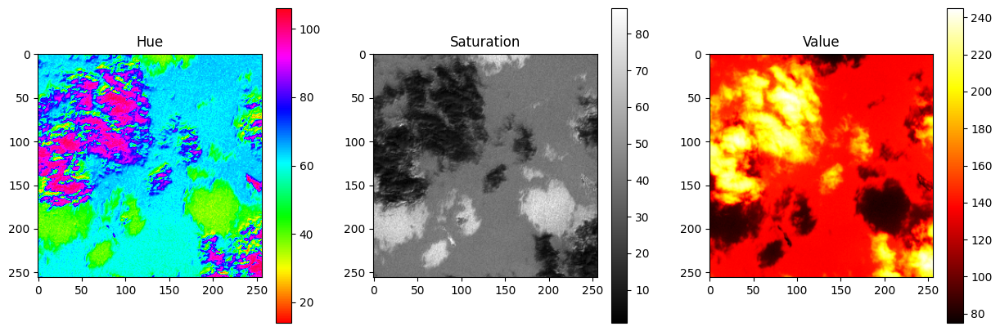

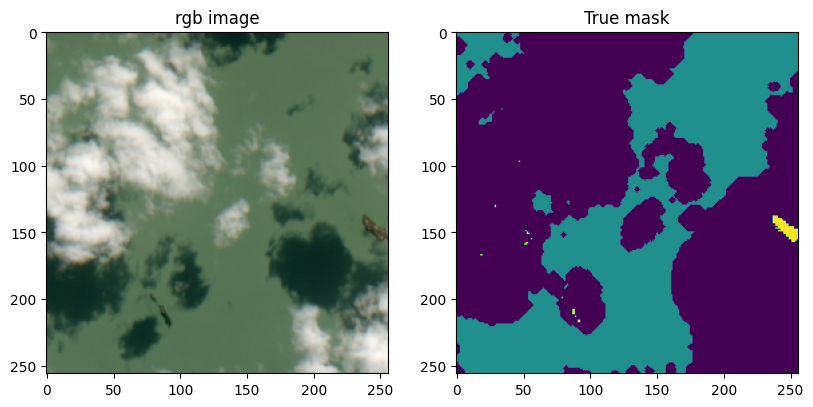

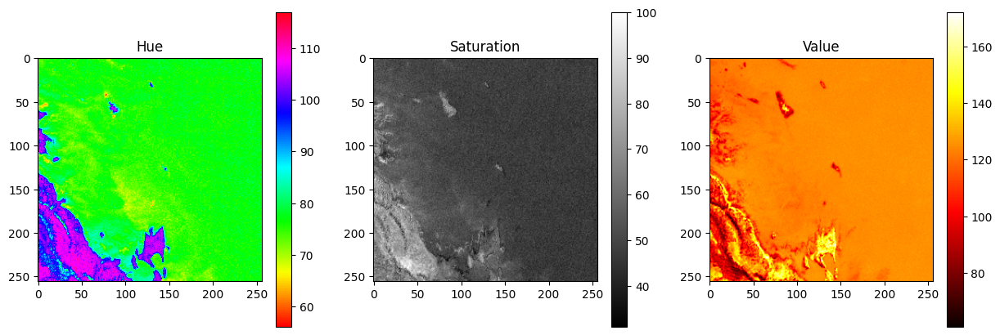

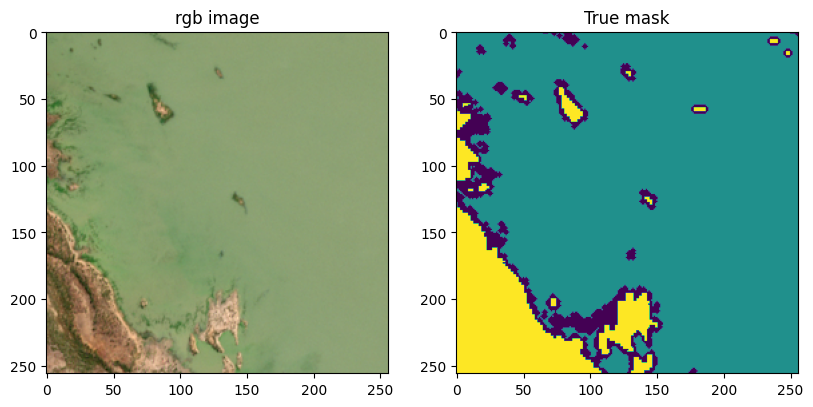

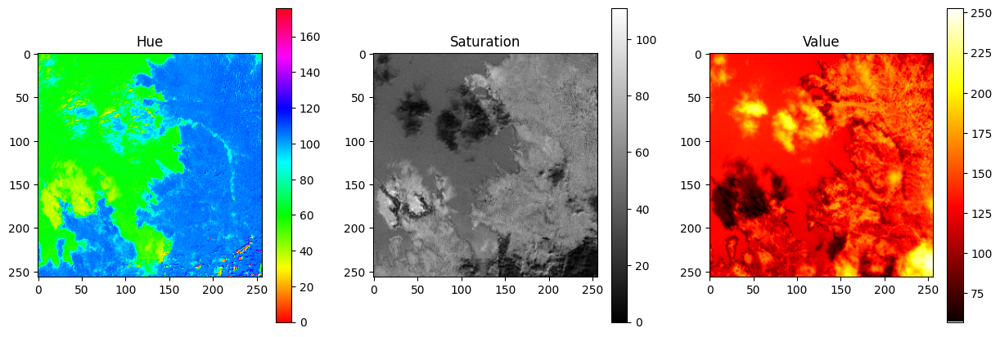

...

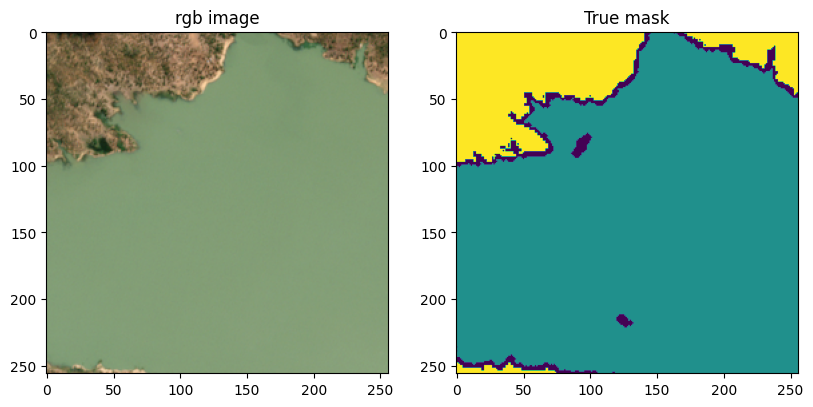

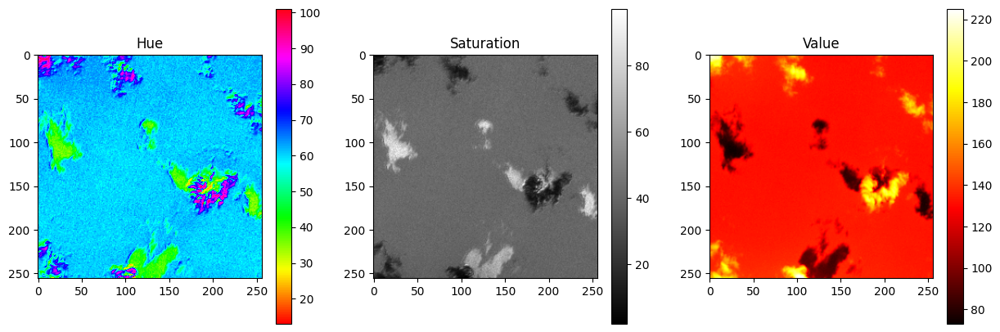

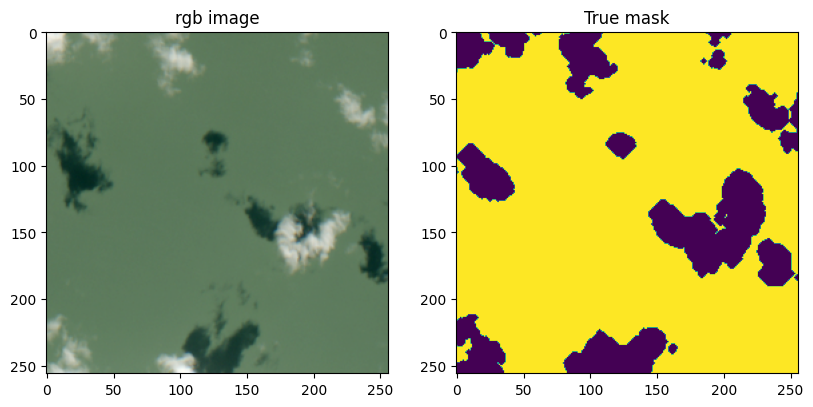

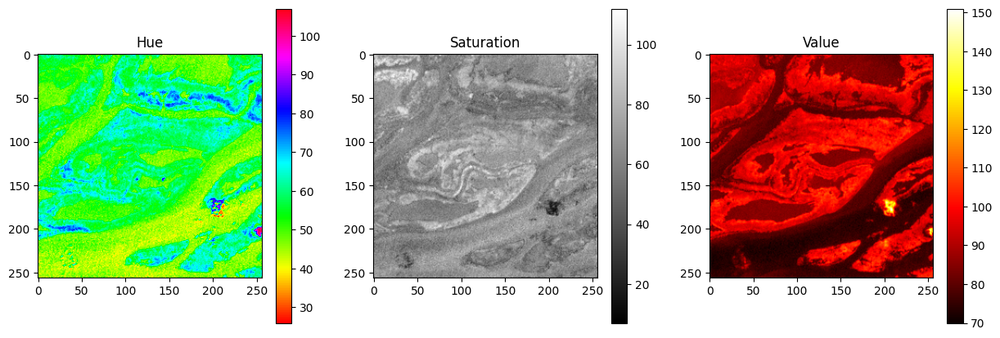

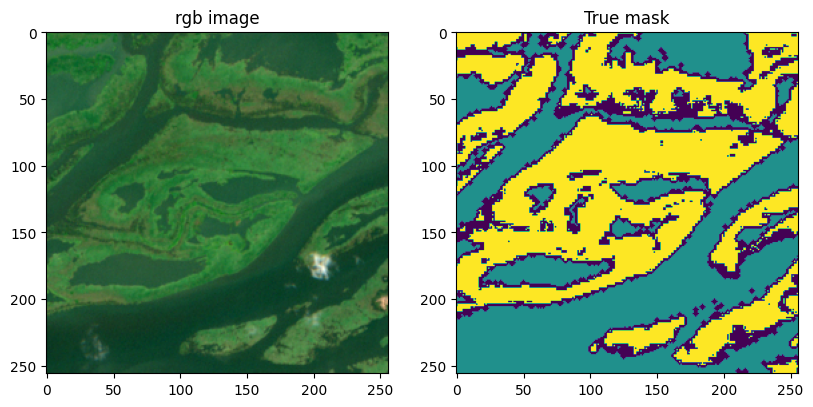

In [61]:
for idx, image in enumerate(selected_input):
  display_hsv_channels(selected_input[idx], selected_mask[idx])
  print()
  print()